# Advanced Lane Finder

This notebook provides an example of how to use the pipeline to process a video of a road and detect its lanes. It also has demonstrations of each stage of the project.

## The Main Project
___

### Import Project Modules

In [1]:
import alf_cam
import alf_enh
import alf_war
import alf_llg
import alf_hud
import alf_con
import alf_utils

%load_ext autoreload
%autoreload 2

### Initialize Logging and Create the Main Controller
To initilize logging, use `alf_utils.init_logging()`.
To create new instance of controller which controls the pipeline, use `alf_con.Controller()`.

In [2]:
alf_utils.init_logging()
ctrlr = alf_con.Controller()

INFO     | alf_utils: Logging initialized.
INFO     | Controller: Initializing components...
INFO     | Camera: Calibrating...
INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.
INFO     | Camera: ...calibrated.
INFO     | ImageWarper: Transformation matrices created.
INFO     | Controller: ...components initialized.


### Specifiy Parameters to Process the Project Video
The parameters are in a dict and have the following keys:
```
    'filename'   : filename of the video to process
    'sob_min_x'  : [0..255] minimum sobel x-gradient to detect edge
    'y_min_s'    : [0..255] minimum saturation (in HSV colorspace) to be considered pixel of yellow lane    
    'y_min_v'    : [0..255] minimum value (in HSV colorspace) to be considered pixel of yellow lane    
    'w_max_s'    : [0..255] minimum saturation (in HSV colorspace) to be considered pixel of white lane    
    'w_min_v'    : [0..255] minimum value (in HSV colorspace) to be considered pixel of white lane       
    'max_coeffs' : [>0] maximum number of sets of coefficients to keep for line comparison purposes
    'min_samples': [>0] minimum number of previous lines needed to smooth
    'N'          : [>0] number of standard deviations from the mean of coeffs to be condsidered a good line
    'coeff_bias' : [0.0..1.0] amounf of weight to put on current coefficents compared to previous coefficients
    'clip_start' : [None or >0] start time on clip to process, in secs; use None to process entire video
    'clip_end'   : [None or >0] end time on clip to process, in secs; use None to process entire video
    'stage'      : [0..5] stage to output;  0 - undistorted image
                                            1 - enahnced edges and hsv color space
                                            2 - top-down view
                                            3 - lane area
                                            4 - lanes unwarped
                                            5 - final composed image
    'output'     : filename of video file to create
```
Call `Controller.processVideo()` using the parameters to process the video.

In [3]:
project_video = {
    'filename'   : 'project_video.mp4',
    'sob_min_x'  : 5,
    'y_min_s'    : 76,    
    'y_min_v'    : 96,
    'w_max_s'    : 30,
    'w_min_v'    : 202,   
    'max_coeffs' : 50,
    'min_samples': 3,
    'N'          : 12,
    'coeff_bias' : 0.9,
    'clip_start' : None,
    'clip_end'   : None,
    'stage'      : 5,
    'output'     : 'out_project_video.mp4'
}
ctrlr.processVideo(project_video)

INFO     | Controller: Processing video: project_video.mp4...
INFO     | Controller: Video processing in progress: 10% complete.
INFO     | Controller: Video processing in progress: 20% complete.
INFO     | Controller: Video processing in progress: 30% complete.
INFO     | Controller: Video processing in progress: 40% complete.
INFO     | Controller: Video processing in progress: 50% complete.
INFO     | Controller: Video processing in progress: 60% complete.
INFO     | Controller: Video processing in progress: 70% complete.
INFO     | Controller: Video processing in progress: 80% complete.
INFO     | Controller: Video processing in progress: 90% complete.
INFO     | Controller: Video processing in progress: 100% complete.
INFO     | Controller: Video processing complete: output_images/out_project_video.mp4.


### Challenge Video
Specify new parameters for `challenge_video.mp4`, restart controller using `Controller.restart()`, and process the video.

In [4]:
challenge_video = {
    'filename'   : 'challenge_video.mp4',
    'sob_min_x'  : 10, 
    'y_min_s'    : 25,  
    'y_min_v'    : 150,
    'w_max_s'    : 12, 
    'w_min_v'    : 158,
    'max_coeffs' : 15,
    'min_samples': 3,
    'N'          : 3,
    'coeff_bias' : 0.9,
    'clip_start' : None,
    'clip_end'   : None,
    'stage'      : 5,
    'output'     : 'out_challenge_video.mp4'
}
ctrlr.restart()
ctrlr.processVideo(challenge_video)

INFO     | Controller: Restarted.
INFO     | Controller: Processing video: challenge_video.mp4...
INFO     | Controller: Video processing in progress: 10% complete.
INFO     | Controller: Video processing in progress: 20% complete.
INFO     | Controller: Video processing in progress: 30% complete.
INFO     | Controller: Video processing in progress: 40% complete.
INFO     | Controller: Video processing in progress: 50% complete.
INFO     | Controller: Video processing in progress: 60% complete.
INFO     | Controller: Video processing in progress: 70% complete.
INFO     | Controller: Video processing in progress: 80% complete.
INFO     | Controller: Video processing in progress: 90% complete.
INFO     | Controller: Video processing in progress: 100% complete.
WARNING  | py.warnings: C:\ProgramData\Anaconda3\envs\carnd-term1\lib\site-packages\moviepy\video\io\ffmpeg_reader.py:130: UserWarning: Warning: in file challenge_video.mp4, 2764800 bytes wanted but 0 bytes read,at frame 484/485, a

## Harder Challenge Video
The challenging conditions of the Harder Challenge Video exceeds the capabilties of this project. To see it anyway, specify new parameters for `harder_challenge_video.mp4`, restart controller using `Controller.restart()`, and process the video.

In [5]:
harder_challenge_video = {
    'filename'   : 'harder_challenge_video.mp4',
    'sob_min_x'  : 10, # tried: 5
    'y_min_s'    : 128, # tried: 87
    'y_min_v'    : 230, 
    'w_max_s'    : 15, # tried: 12, 25 
    'w_min_v'    : 200, # tried: 158, 125
    'max_coeffs' : 60,
    'min_samples': 3,
    'N'          : 12,
    'coeff_bias' : 0.9,
    'clip_start' : None,
    'clip_end'   : None,
    'stage'      : 5,
    'output'     : 'out_harder_challenge_video.mp4'
}  
ctrlr.restart()
ctrlr.processVideo(harder_challenge_video)

INFO     | Controller: Restarted.
INFO     | Controller: Processing video: harder_challenge_video.mp4...
WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

INFO     | Controller: Video processing in progress: 10% complete.
WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git

INFO     | Controller: Video processing in progress: 40% complete.
WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

INFO     | Controller: Video processing in progress: 50% complete.
WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:869: RankWarning: Polyfit may be poorly conditioned
  self.lane_line.fit(x_lane_points, y_lane_points)

WARNING  | py.warnings: C:\Users\Owner\Documents\git\CarND-Advanced-Lane-Lines\alf_llg.py:

## Demos of Pipeline Stages
___
The rest of this notebook illustrates some of the more important functions of the pipeline.
### Chessboard Corners
Shows images of inner corners located to verify correct mapping of `objpoints` to `imgpoints` for calibration.

INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.


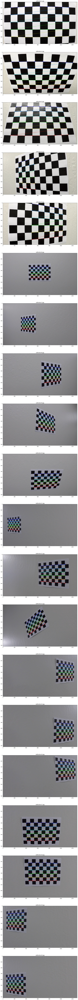

In [6]:
alf_utils.demoChessboardCorners()

### Camera Calibration
Shows before and after images of the effects of distortion correction.

INFO     | Camera: Calibrating...
INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.
INFO     | Camera: ...calibrated.


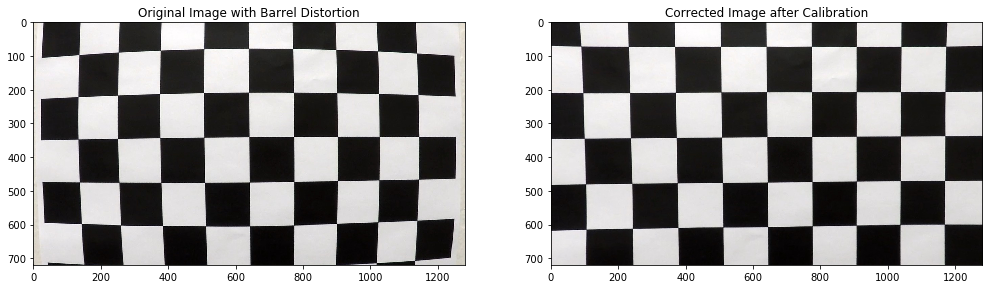

In [7]:
alf_utils.demoCameraCalibration()

### Perspective Transformation
Shows image of road with perspective transformed to a top-down view.

INFO     | Camera: Calibrating...
INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.
INFO     | Camera: ...calibrated.
INFO     | ImageWarper: Transformation matrices created.


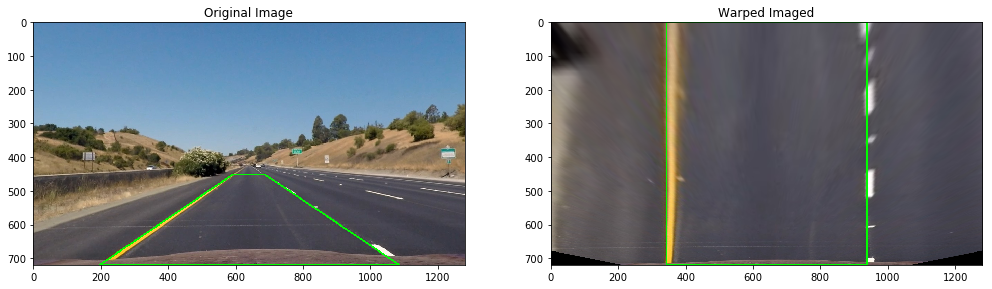

In [8]:
alf_utils.demoWarpImage("test_images/straight_lines1.jpg")

### Image Enhancement
Shows image of Sobel-X gradient and HSV Color Transformations masks.

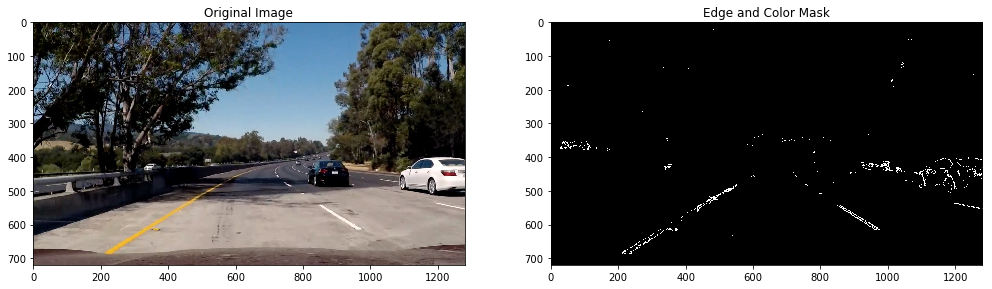

In [9]:
alf_utils.demoEnhance("test_images/test5.jpg")

### Lane Search
Shows images of lane search areas, lane pixels detected, lines representing the lanes, and lane area.

INFO     | Camera: Calibrating...
INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.
INFO     | Camera: ...calibrated.
INFO     | ImageWarper: Transformation matrices created.


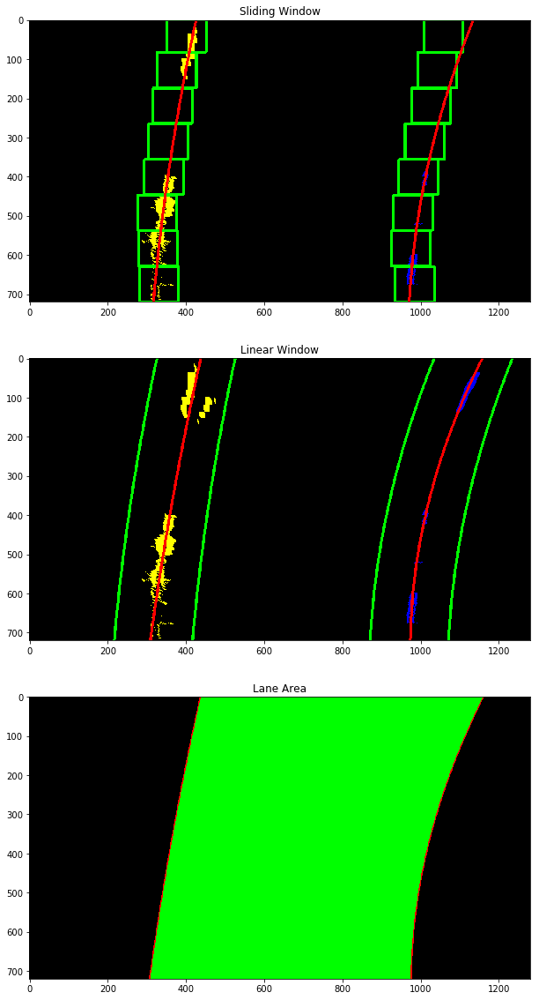

In [10]:
alf_utils.demoLaneSearch("test_images/test5.jpg")

## Final Image
Shows the combined original image, lane areas, radius of curvature, and center offset.

INFO     | Camera: Calibrating...
INFO     | ChessboardImages: Loading chessboard images...
INFO     | ChessboardImages: ...completed loading chessboard images.
INFO     | ChessboardImages: Finding chessboard corners...
INFO     | ChessboardImages: ...completed finding chessboard corners.
INFO     | Camera: ...calibrated.
INFO     | ImageWarper: Transformation matrices created.


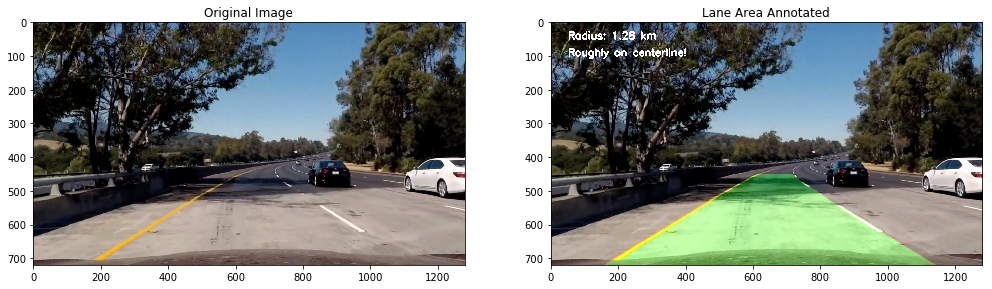

In [11]:
alf_utils.demoCompose("test_images/test5.jpg")

## Shutdown Logging
___
Release log file.

In [12]:
alf_utils.shutdown_logging()

INFO     | alf_utils: Logging shutdown.
